# Clustering on Amazon Data

In [ ]:
#! pip install spacy[cuda112,lookups,transformers]
#! python -m spacy download en_core_web_sm

In [88]:
%matplotlib inline

import pandas as pd
from datetime import datetime
import numpy as np
import os

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score ,calinski_harabasz_score, davies_bouldin_score, adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram
from kmodes.kprototypes import KPrototypes

import spacy
from spacy import displacy

import plotly
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.graph_objects as go

## Load data

In [2]:
## Custom plotly plot styling

# Remove the red color in discrete color scale
px.colors.qualitative.Plotly = px.colors.qualitative.Plotly[:1] + px.colors.qualitative.Plotly[2:]

pio.templates["custom"] = go.layout.Template(
    layout=go.Layout(
        paper_bgcolor="rgba(0, 0, 0, 0)",
        font=dict(color="lightgreen"),
        colorscale=dict(sequential="Viridis"),
        colorway=px.colors.qualitative.Plotly)
)

pio.templates.default = "plotly+custom"

# Settings for plot rendering, makes work with HTML output + jupyer lab + static output
pio.renderers.default = "plotly_mimetype+notebook_connected+png"

In [3]:
data_path = os.path.normpath("../data/products_cleaned.csv")
df_az = pd.read_csv(data_path, dtype={"Category": "category"}, parse_dates=["Date Scraped"])

print(df_az.dtypes)
df_az

Asin                       object
Name                       object
Image Url                  object
Is Best Seller               bool
Stars                     float64
Reviews                   float64
Url                        object
Price                     float64
Date Scraped       datetime64[ns]
List Price                float64
Bought In Month           float64
Category                 category
dtype: object


,Asin,Name,Image Url,Is Best Seller,Stars,Reviews,Url,Price,Date Scraped,List Price,Bought In Month,Category
0,B0CSPPHXXV,Apple Watch Ultra 2 (GPS + Cellular 49mm) Rugg...,https://m.media-amazon.com/images/I/814xH1gpid...,False,NaN,0.0,https://www.amazon.com/Apple-Cellular-Rugged-T...,699.97,2024-02-01,779.99,NaN,NaN
1,B0BDJ4MGFQ,AppleWatch Series 8 [GPS + Cellular 45mm] Smar...,https://m.media-amazon.com/images/I/91WpS8h5Jv...,False,4.7,4100.0,https://www.amazon.com/Apple-Cellular-Starligh...,689.00,2024-02-01,799.00,NaN,NaN
2,B0CSV7LK7D,AppleWatch Series 9 [GPS + Cellular 45mm] Smar...,https://m.media-amazon.com/images/I/61DZ+Vezk0...,False,NaN,0.0,https://www.amazon.com/Apple-Cellular-Smartwat...,679.00,2024-02-01,679.00,NaN,NaN
3,B0B8GHHD2F,AppleWatch Series 7 [GPS + Cellular 45mm] Smar...,https://m.media-amazon.com/images/I/51aQmgx9Ql...,False,NaN,0.0,https://www.amazon.com/Apple-Cellular-Aluminum...,608.00,2024-02-01,608.00,NaN,NaN
4,B0B8GDV9GN,AppleWatch Series 7 [GPS + Cellular 45mm] Smar...,https://m.media-amazon.com/images/I/61O671oWHg...,False,NaN,0.0,https://www.amazon.com/Apple-Cellular-Aluminum...,608.00,2024-02-01,608.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1389694,B00R3LIKCO,American Flag Patriotic USA Classic 5 Panel Me...,https://m.media-amazon.com/images/I/71PDJFz6AA...,False,4.2,0.0,https://www.amazon.com/dp/B00R3LIKCO,14.95,2023-11-01,14.95,0.0,Men's Accessories
1389695,B098BQ7ZQ3,Men's Baseball Cap - H2O-DRI Line Up Curved Br...,https://m.media-amazon.com/images/I/812Tycexs4...,False,4.4,0.0,https://www.amazon.com/dp/B098BQ7ZQ3,33.99,2023-11-01,33.99,0.0,Men's Accessories
1389696,B07X1MVNT1,[4 Pack] Adjustable Eyeglasses and Sunglasses ...,https://m.media-amazon.com/images/I/61vvYW1S9J...,False,3.6,0.0,https://www.amazon.com/dp/B07X1MVNT1,8.54,2023-11-01,8.54,0.0,Men's Accessories
1389697,B08XLBG8V9,Ax2002 Aviator Sunglasses,https://m.media-amazon.com/images/I/51+yjD4F1x...,False,4.5,0.0,https://www.amazon.com/dp/B08XLBG8V9,54.36,2023-11-01,57.39,0.0,Men's Accessories


## Transform/prepare data

In [71]:
# Get numerical/bool columns
df_clust = df_az.select_dtypes(include=[np.number, bool])
df_clust["Is Best Seller"] = df_clust["Is Best Seller"].astype(int)

# No NaNs allowed
df_clust = df_clust.fillna(0)

# Scale data
df_clust = (df_clust-df_clust.min())/(df_clust.max()-df_clust.min())

# Remove all-zeros rows (resulting from scaling)
df_clust = df_clust[~(df_clust == 0).all(axis=1)]

In [5]:
# Get parsed product names to then turn into lists of keywords
# ONLY RUN ONCE!!! EXPENSIVE!!!
spacy.prefer_gpu()
nlp = spacy.load("en_core_web_sm", enable=["tok2vec", 'tagger', 'attribute_ruler', "lemmatizer", "parser"])

alldocs = df_az["Name"].map(nlp).tolist()

C:\Users\Bhavana\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning:

[W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.



KeyboardInterrupt: 

In [82]:
# print([[t.lemma_ for t in d if t.is_alpha and not t.is_stop] for d in tst])
# t2 = [t.lemma_ for d in tst for t in d if t.is_alpha and not t.is_stop]
# print(len(t2), len(set(t2)))

print([([t.head for t in d if t.is_alpha and not t.is_stop], d) for d in tst])

[([Tombow, Set, Set, Set, Tombow, Degrees, Set, Degrees, Quality, Graphite, Set, Set, Set, with, Eraser], Tombow 51523 MONO Drawing Pencil Set, Assorted Degrees, 12-Pack. Professional Quality Graphite Pencil Set with Eraser and Sharpener), ([Rotors, Rotors, Rotors, System, System, System, for, System, Sportster, Sportster, Wheel, Wheel, Wheel, for, Proof, Hardened, Rotors, Steel, Brake, Rotors, Rotors], SHARKROAD 2 Pieces Front Rotors for Harley Davidson Brake System, Two-11.5'' Front Rotor for Harley Touring Sportster Softail Dyna Front Wheel, Vibration Proof Hardened Stainless Steel Brake Rotors), ([Reusable, Stencil, Stencil, Stencil, Floor, Stencils, Stencils, Floors, Stencils, Stencils, for, Paint, Stencils, for, Wood, Walls, Wood, DIY, Décor, Décor, Craft, Craft, for, Craft], Mandala Reusable Tile Stencil 12x12 Large Floor Stencils for Painting Floors Concrete Stencils for Patio Paint Stencils for Walls and Floors Furniture Wood DIY Home Décor Art Craft (Boho)), ([Gun, Gun, Gun, 

In [78]:
displacy.render(tst.tolist(), jupyter=True, style="dep")

## Clustering

In [9]:
## Helper function copied from "https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html"
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [37]:
ks = range(2, 7)

## Standard K means, multiple Ks
kmeans_models = []
for k in ks:
    kmeans = KMeans(n_clusters=k, max_iter=500)
    kmeans.fit_predict(df_clust)
    kmeans_models.append(kmeans)

## Standard hier, with cosine similarity
# Make smaller dataset since full hierarchical clustering failing from memory issues
df_clust_sample = df_clust.sample(frac=0.05)

# Use 2 clusters in order to make dendrogram and then choose k from there
hier = AgglomerativeClustering(n_clusters=2, metric="cosine", linkage="average", compute_distances=True)
hier.fit_predict(df_clust_sample)

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [79]:
## Kprototypes,  multiple Ks

# Include the categorical column, using smaller sample since takes while to run
df_clust_withcats = pd.concat([df_clust_sample, 
                               df_az.loc[df_clust_sample.index]["Category"].cat.add_categories("").fillna(""), 
                               df_az.loc[df_clust_sample.index]["Date Scraped"].astype("category")], 
                              axis=1)

kprot = KPrototypes(n_clusters=2, n_init=6)
kprot.fit_predict(df_clust_withcats, categorical=[6, 7])


# Hier with Gower distance
# TODO

array([1, 1, 1, ..., 1, 1, 1], dtype=uint16)

## Plotting

In [33]:
WCSS = [k.inertia_ for k in kmeans_models]
silh = [silhouette_score(df_clust, k.labels_, sample_size=len(df_clust) // 50) for k in kmeans_models]

print(WCSS, silh)

[52466.445753091, 42560.703191829896, 37955.59780801967, 30010.765661165904, 25547.29077174213] [0.7915705106907097, 0.6605539099138353, 0.33153764316747086, 0.40004941854890225, 0.6891371590207837]


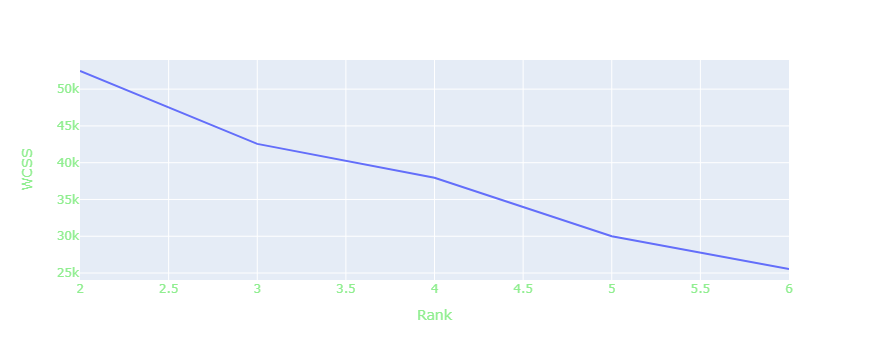

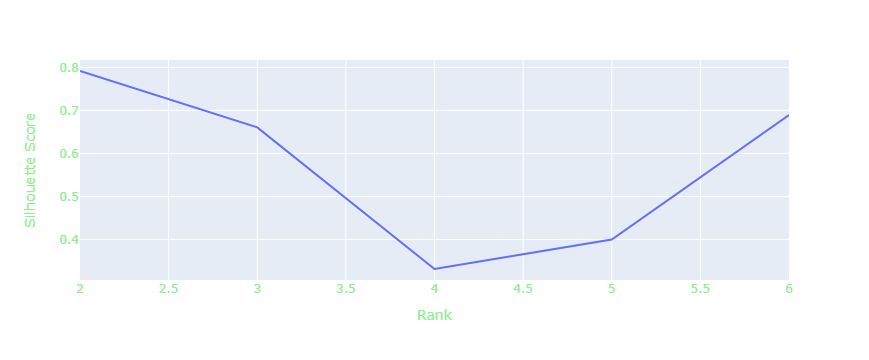

In [42]:
# Make elbow and silhouette score plots
fig = px.line(x=ks, y=WCSS, labels={"x": "Rank", "y": "WCSS"})
fig.show()

fig = px.line(x=ks, y=silh, labels={"x": "Rank", "y": "Silhouette Score"})
fig.show()

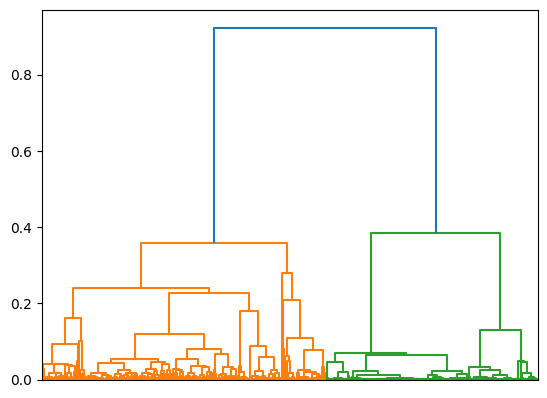

In [38]:
# plot_dendrogram(hier, truncate_mode="lastp", p=100)
plot_dendrogram(hier, truncate_mode="level", p=12, no_labels=True)

In [87]:
df_clust["labels_kmeans2"] = kmeans_models[0].labels_
df_clust.loc[df_clust_sample.index]["labels_kmeans2"]

347466     0
40378      0
1139885    0
1185323    0
469212     0
          ..
931273     0
594505     0
399402     0
751796     0
977583     0
Name: labels_kmeans2, Length: 69484, dtype: int32

[[1.0, 0.96363896140556, 1.0], [0.96363896140556, 1.0, 0.96363896140556], [1.0, 0.96363896140556, 1.0]]


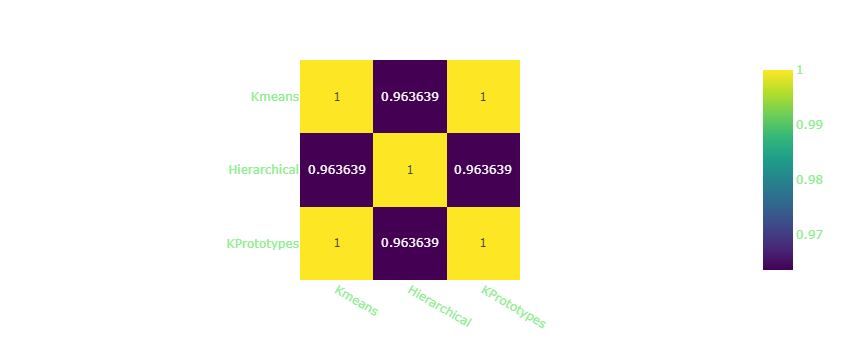

In [90]:
# Rand Index Matrix
rands = []
rand_labels = [df_clust.loc[df_clust_sample.index]["labels_kmeans2"], hier.labels_, kprot.labels_]
for i, label in enumerate(rand_labels):
    rands.append([adjusted_rand_score(label, l) for l in rand_labels])

print(rands)
models = ["Kmeans", "Hierarchical", "KPrototypes"]

fig = px.imshow(rands, x=models, y=models, text_auto=True)
fig.show()

### Save subset of data for plotting in website

In [105]:
df_az.loc[df_clust_sample.index].to_csv(os.path.normpath("../data/analysis/products_clustering.csv"), index=False)

In [107]:
tst_read = pd.read_csv(os.path.normpath("../data/analysis/products_clustering.csv"), 
                       dtype={"Category": "category", "Labels": "category"}, 
                       parse_dates=["Date Scraped"])
tst_read

,Asin,Name,Image Url,Is Best Seller,Stars,Reviews,Url,Price,Date Scraped,List Price,Bought In Month,Category,Labels
0,B0BFCN85KS,"Parrot Training Shoulder Cape, Parrot Anti Scr...",https://m.media-amazon.com/images/I/61n7vkI3fx...,False,4.2,0.0,https://www.amazon.com/dp/B0BFCN85KS,15.99,2023-11-01,15.99,0.0,Pet Bird Supplies,0.0
1,B0BQ26KHYJ,Unisex-Adult Classic Spray Camo Clog,https://m.media-amazon.com/images/I/812G5brlyw...,False,4.7,0.0,https://www.amazon.com/dp/B0BQ26KHYJ,27.50,2023-11-01,54.99,0.0,Men's Shoes,0.0
2,B099V1Z4L6,"Supply Giant Floor Cleanout Cover Plate, 8-Inc...",https://m.media-amazon.com/images/I/51W7E4EoBA...,False,3.8,0.0,https://www.amazon.com/dp/B099V1Z4L6,13.89,2023-11-01,15.99,0.0,Pumps & Plumbing Equipment,0.0
3,B0828LFBJZ,Boys' UPF 50+ Rash Guard Swim Shirt,https://m.media-amazon.com/images/I/91YLQsHPBf...,False,4.6,0.0,https://www.amazon.com/dp/B0828LFBJZ,20.68,2023-11-01,20.68,0.0,Boys' Clothing,0.0
4,B002WKGVQ8,1000m PolySelect Thread Raspberry 1155,https://m.media-amazon.com/images/I/41W51xfN63...,False,5.0,0.0,https://www.amazon.com/dp/B002WKGVQ8,5.95,2023-11-01,5.95,0.0,Needlework Supplies,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69479,B0BKTM2GQM,"Velvet Bows for Baby Girls, 20pcs Boutique Tin...",https://m.media-amazon.com/images/I/71dVP-7pmt...,False,5.0,0.0,https://www.amazon.com/dp/B0BKTM2GQM,16.75,2023-11-01,16.75,100.0,Baby Care Products,0.0
69480,B0034JR0QG,"StrollAir Universal Handle Sleeve Cover, Grip ...",https://m.media-amazon.com/images/I/41-IkbTGHx...,False,4.5,0.0,https://www.amazon.com/dp/B0034JR0QG,19.99,2023-11-01,19.99,100.0,Baby Strollers & Accessories,0.0
69481,B07DBZGG7D,"YARONGTECH RFID Bracelet,125khz em4100 RFID Si...",https://m.media-amazon.com/images/I/51pnySnLYo...,False,2.7,0.0,https://www.amazon.com/dp/B07DBZGG7D,7.89,2023-11-01,7.89,0.0,Security & Surveillance Equipment,0.0
69482,B09TQ1J58V,HYTE Y60 Modern Aesthetic Dual Chamber Panoram...,https://m.media-amazon.com/images/I/71h4OwDWGH...,False,4.8,0.0,https://www.amazon.com/dp/B09TQ1J58V,189.99,2023-11-01,199.99,0.0,Computer Components,0.0


C:\Users\Bhavana\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\plotly\express\_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



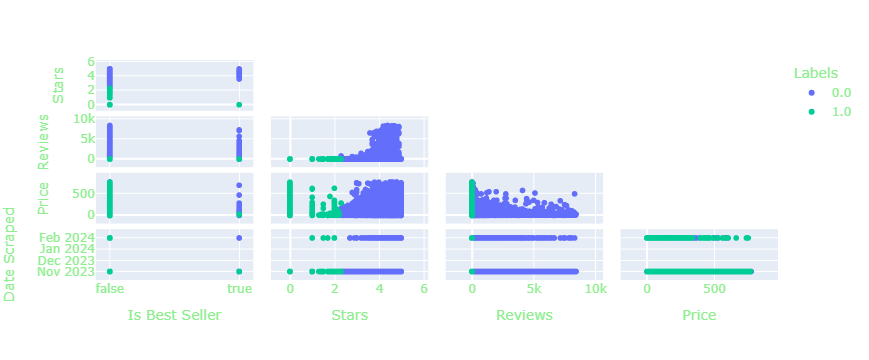

In [108]:
# df_az["Labels"] = np.NaN
# df_az.loc[df_clust_sample.index, "Labels"] = df_clust.loc[df_clust_sample.index]["labels_kmeans2"]
# df_az["Labels"] = df_az["Labels"].astype("category")

fig = px.scatter_matrix(tst_read, 
                        dimensions=["Is Best Seller", "Stars", "Reviews", "Price", "Date Scraped"],
                       color="Labels")
fig.update_traces(diagonal_visible=False, showupperhalf=False)
fig.update_layout(height=700)
fig.show()

In [109]:
tst_read.groupby("Labels").describe()

C:\Users\Bhavana\AppData\Local\Temp\ipykernel_14068\2733530561.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Stars                                               Reviews  \
          count      mean  min  25%  50%  75%  max       std    count   
Labels                                                                  
0.0     62614.0  4.425795  2.3  4.3  4.5  4.7  5.0  0.390886  62614.0   
1.0      6627.0  0.079448  0.0  0.0  0.0  0.0  2.3  0.347941   6870.0   

                    ... List Price            Bought In Month              \
              mean  ...        max        std           count        mean   
Labels              ...                                                     
0.0     129.542642  ...     799.95  65.295120         62172.0  111.710255   
1.0       0.036099  ...     770.70  88.988387          6621.0    6.192418   

                                                  
        min  25%  50%    75%     max         std  
Labels                                            
0.0     0.0  0.0  0.0  100.0  3000.0  297.831100  
1.0     0.0  0.0  0.0    0.0  2000.0   51.254815  

[2 rows x 48 columns]